### Notebook to estimate the snowcover using the NIR band of PlanetScope 4-band imagery
Rainey Aberle

Fall 2021

__To-Do:__
- filter images using RGI outline
- cloud masking
- develop threshold or more accurate classification method
- estimate total area

In [ ]:
# Install any necessary packages
#!pip3 install rioxarray

In [32]:
# Import packages
import geopandas as gpd
import pandas as pd
import os
import numpy as np
import rasterio as rio
import datetime
from matplotlib.dates import DateFormatter
from rasterio.mask import mask
import matplotlib.pyplot as plt
import glob
from rasterio.plot import show

# base directory
basepath = '/Users/raineyaberle/Research/PhD/Wolverine/'
# image directory
impath = basepath+'images/2021-04-20_2021-08-25/SR-stitched/'
# output folder
outpath = basepath+'images/2021-04-20_2021-08-25/gif/'

In [2]:
### Load RGI shapefile ###
shp_filename = basepath+'GIS_data/wolverine_RGI.shp'
shp = gpd.read_file(shp_filename)
print('Original shapefile CRS:',shp.crs)

# Reproject
shp_rpj = shp.to_crs(32606)

# print information
print('Reprojected shapefile CRS: ',shp_rpj.crs)
print('Shapefile bounds:',shp_rpj.boundary)

Original shapefile CRS: epsg:4326
Reprojected shapefile CRS:  epsg:32606
Shapefile bounds: 0    MULTILINESTRING ((393342.531 6698475.452, 3933...
dtype: geometry


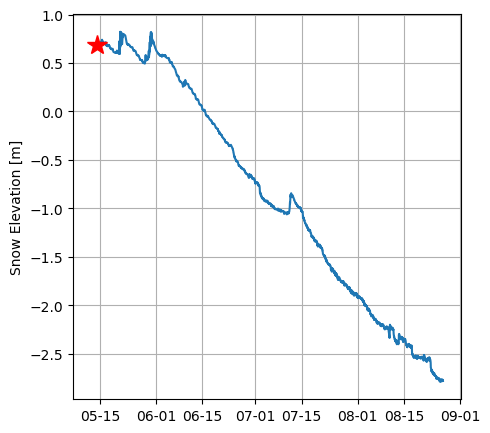

In [42]:
### Load sonic ranger data ###
sr = pd.read_csv(basepath+'field_data/ranger/CR300Series_AKsnowdHr.dat', header=1)
sr_dt = pd.to_datetime(sr['TIMESTAMP'][2:])
sr_sd = np.asarray(sr['Snowd_m'][2:], dtype=np.float64)
sr_Tair = np.asarray(sr['AirTemp_C'][2:], dtype=np.float64)

In [44]:
### Load images ###
# specify directory where images are held
os.chdir(impath) # change directory
im_names = glob.glob('*.tif') # load all .tif file names
im_names.sort() # sort file names by date

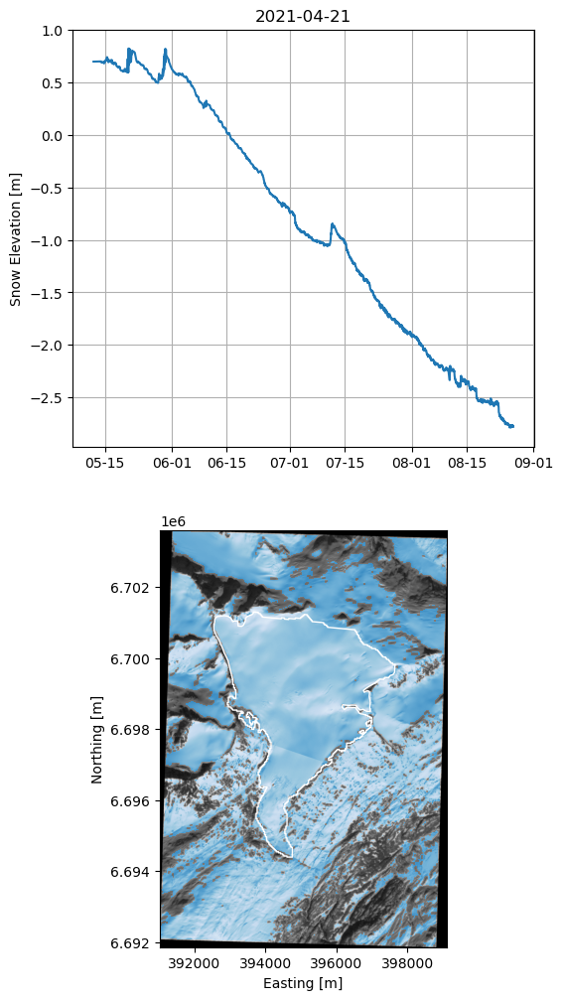

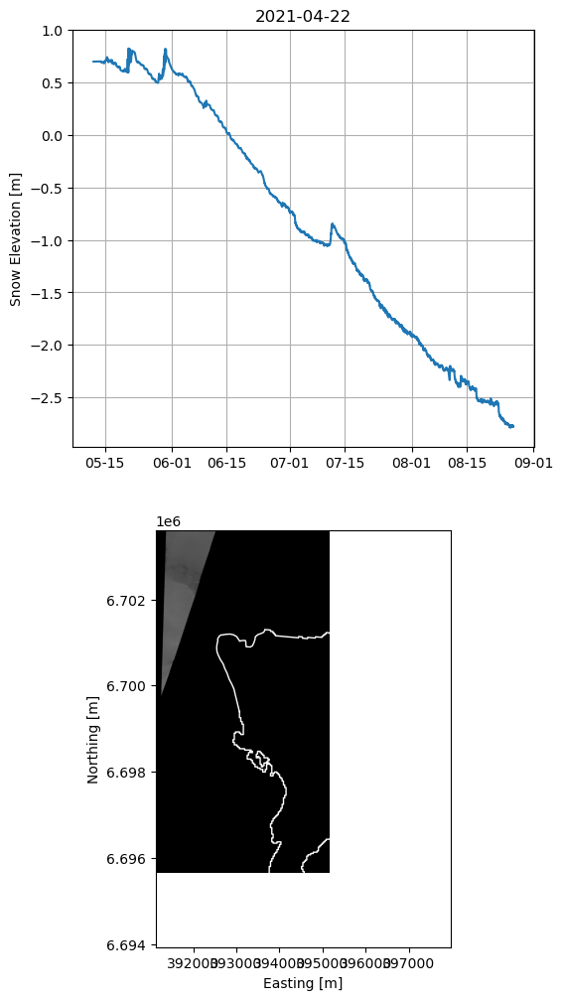

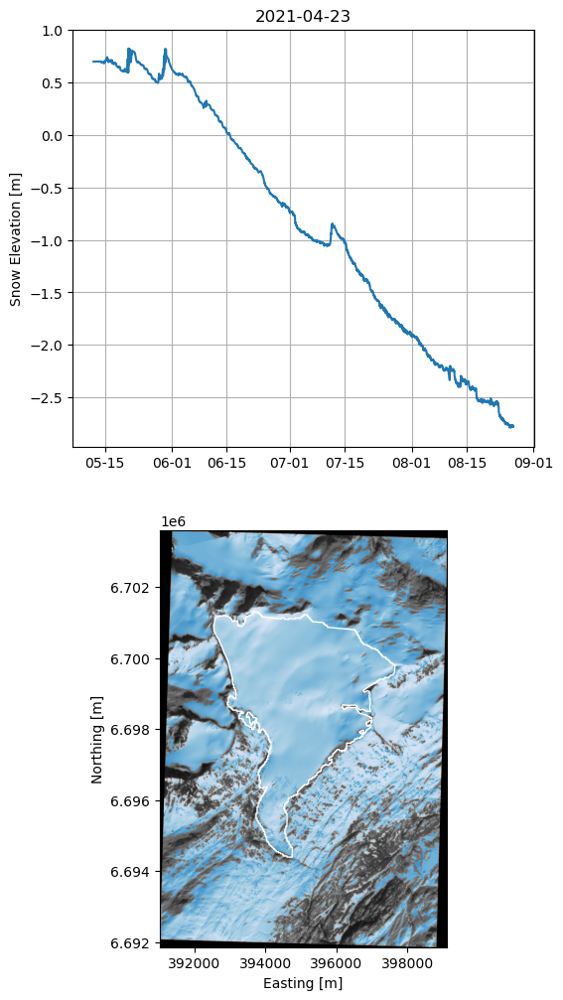

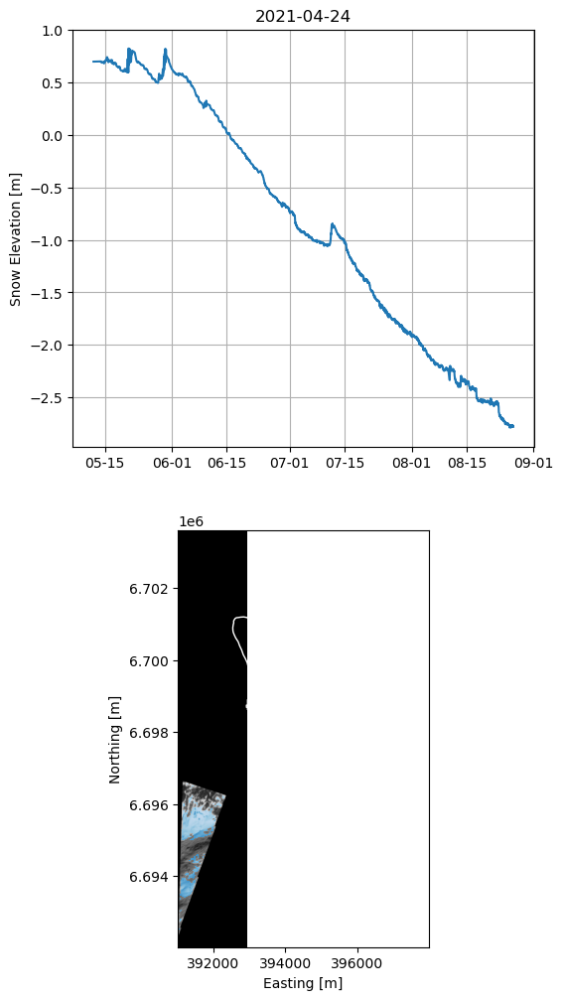

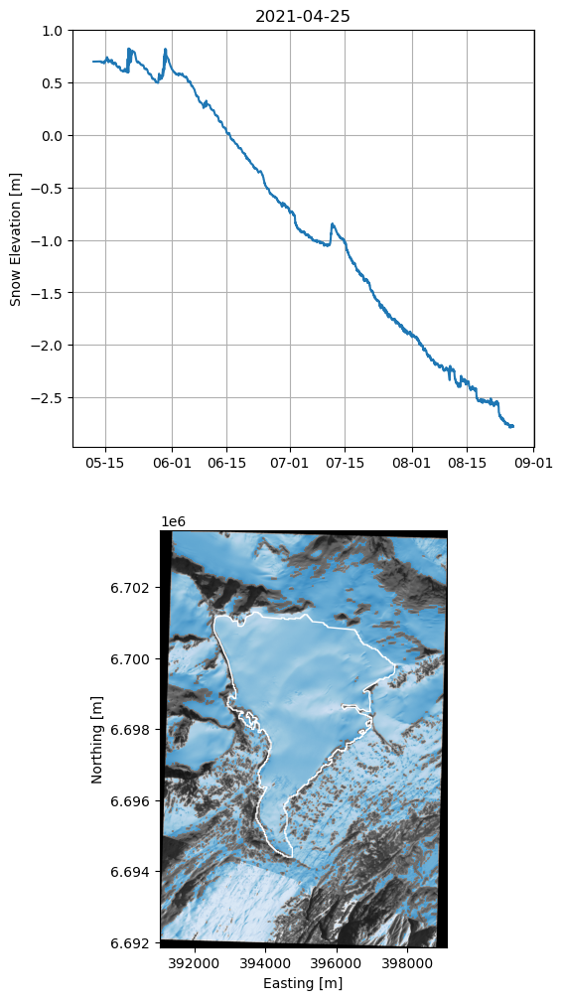

...

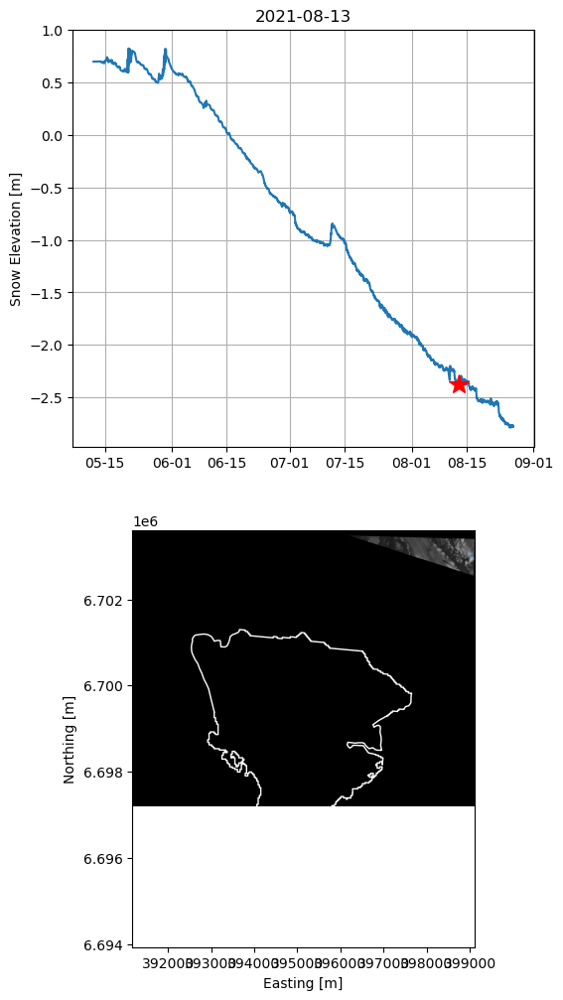

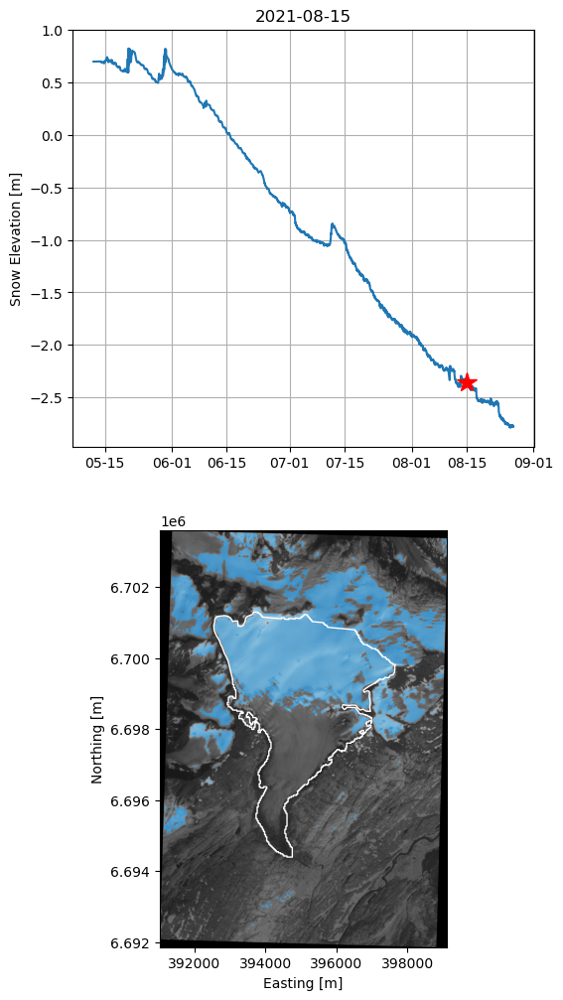

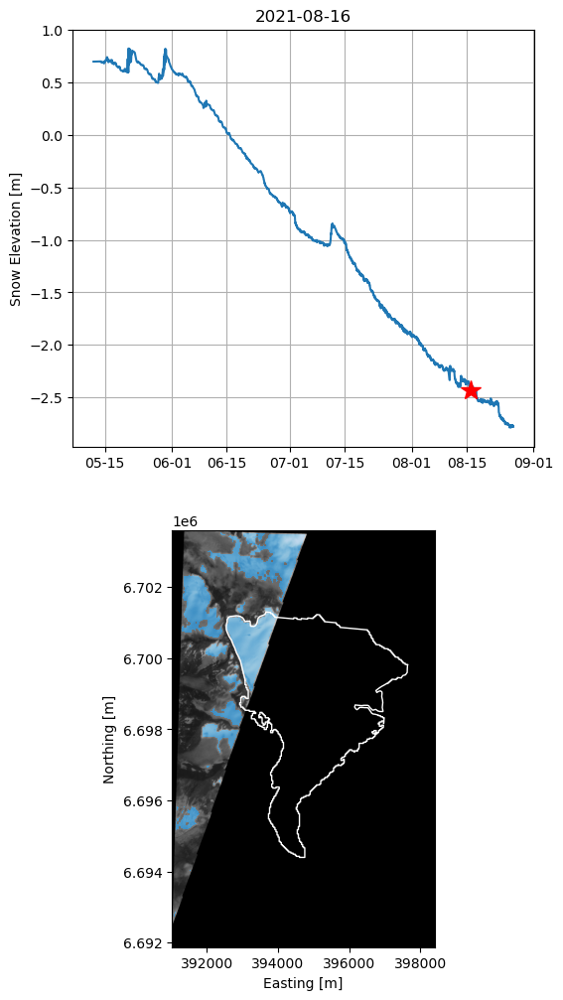

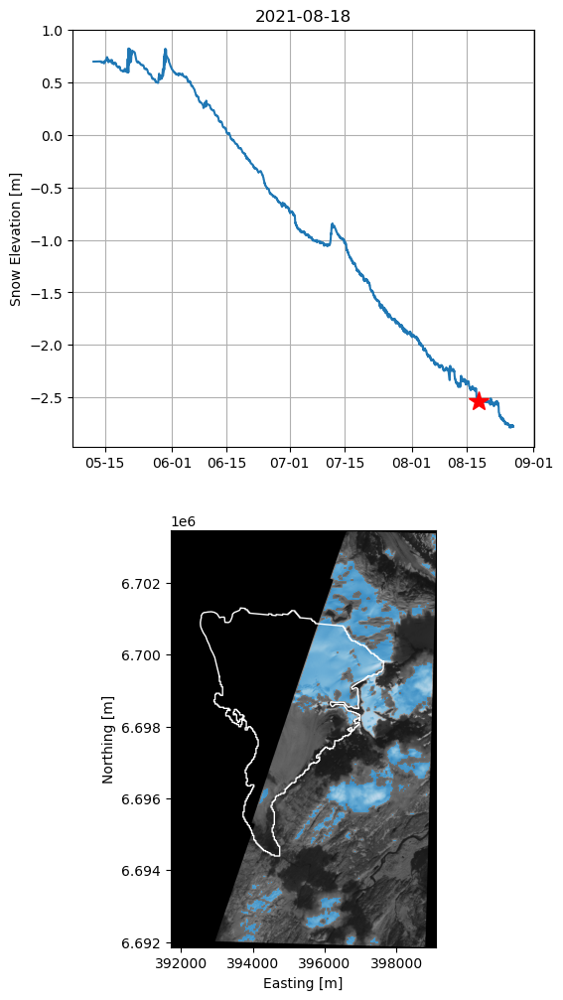

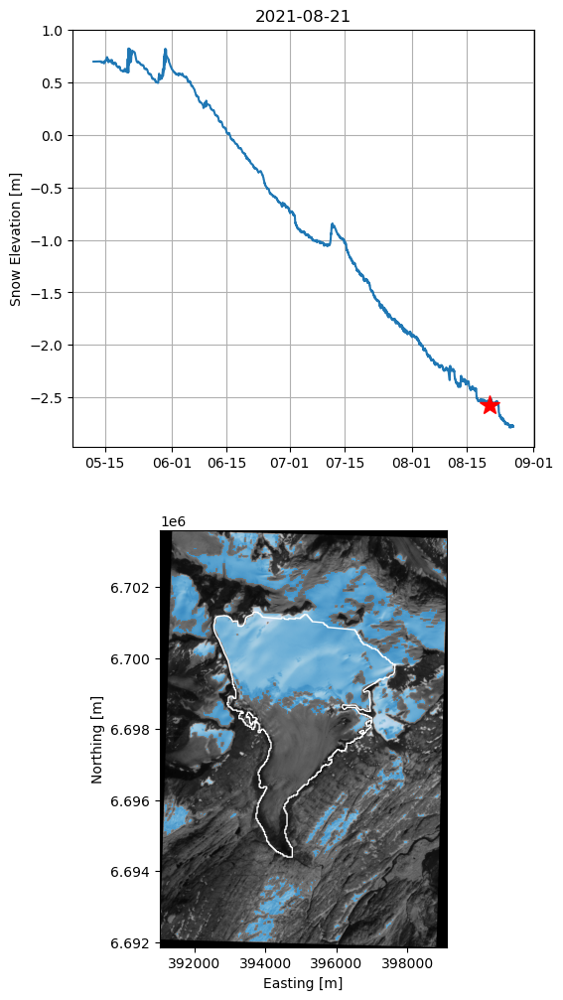

In [88]:
### Plot snow depth & NIR images ###

# specify color schemes for plotting
cm_greys = plt.cm.get_cmap('Greys').reversed()
cm_blues = plt.cm.get_cmap('Blues').reversed()

# loop through images
for im_name in im_names:
    
    # read in image
    im = rio.open(im_name)   

    # define NIR band
    nir = im.read(4)
    
    # get TOA reflectance
    refl_coeff = 9.01261266587e-05 # from image metadata
    nir_TOA = nir*refl_coeff
    
    # grab date from file name
    date = pd.to_datetime(im_name[0:8])
    
    # find date index for sonic ranger data
    I = (np.abs(sr_dt - date)).argmin()
    
    # threshold NIR band to estimate snow cover
    nir_thresh = np.where(nir_TOA>0.4, nir_TOA, np.nan)
    
    # plot
    fig, (ax1,ax2) = plt.subplots(2,1, figsize=(6,12))
    ax1.set_title(im_name[0:4]+'-'+im_name[4:6]+'-'+im_name[6:8])
    # plot snow depth time series
    ax1.plot(sr_dt[pd.notna(sr_sd)],sr_sd[pd.notna(sr_sd)])
    # If I !=0, plot snow depth for nearest date to image date
    if I!=0:
        ax1.plot(sr_dt[I],sr_sd[I],'*r', markersize=15)
    ax1.grid()
    ax1.set_ylabel('Snow Elevation [m]')
    # change x-axis date label format
    date_form = DateFormatter("%m-%d")
    ax1.xaxis.set_major_formatter(date_form)
    # plot NIR band madness
    show(nir_TOA, transform=im.transform, cmap=cm_greys, clim=(0,1.2), ax=ax2) # NIR band
    show(nir_thresh, transform=im.transform, cmap=cm_blues, clim=(0,1.2), ax=ax2) # NIR thresholded area
    shp_rpj.plot(facecolor='none',edgecolor='white',ax=ax2) # RGI outline 
    ax2.set_xlabel('Easting [m]')
    ax2.set_ylabel('Northing [m]')
    # save image
    plt.savefig(outpath+im_name[0:8]+'_NIR_snowd.png',dpi=150)
    # show image
    plt.show()